Note to the grader: As I explained in my code, for the second part I pick 50k keypoints from SIFT to reduce memory usage. However, when running my code on 16GB of RAM, almost all my RAM was used. So, if your system has less RAM, you should reduce 50k to a smaller number. Also, for RANSAC, the number of iterations is 50k. The code does not take long to run but you may still want to reduce it if you want to run it faster.

# Importing necessary packages

In [1]:
import kornia as K
import torch
import matplotlib.pyplot as plt
import numpy as np
import cv2
import skimage

# 1 RANSAC-based Image Stitching

## Part A:

### **Step 1: Preprocessing**

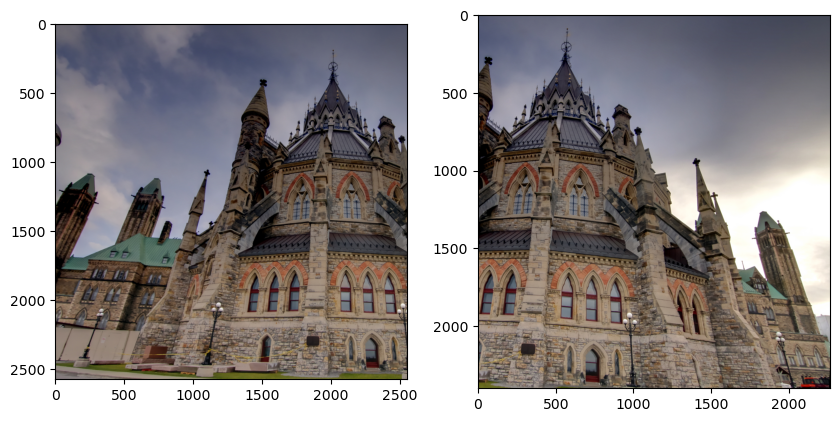

In [2]:
img_left = plt.imread('parliament-left.jpg')
img_right = plt.imread('parliament-right.jpg')
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 10))
ax[0].imshow(img_left)
ax[1].imshow(img_right)
plt.show()

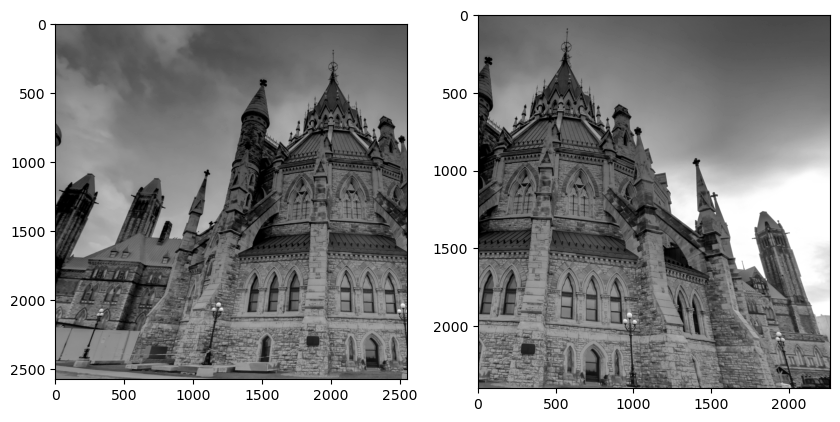

In [3]:
img_left_gray = cv2.cvtColor(img_left, cv2.COLOR_RGB2GRAY)
img_right_gray = cv2.cvtColor(img_right, cv2.COLOR_RGB2GRAY)
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 10))
ax[0].imshow(img_left_gray, 'gray')
ax[1].imshow(img_right_gray, 'gray')
plt.show()

### **Step 2: Detect keypoints and extract descriptors**

In [4]:
key_points_left, descriptor_left = cv2.SIFT.create().detectAndCompute(img_left_gray, None)
key_points_right, descriptor_right = cv2.SIFT.create().detectAndCompute(img_right_gray, None)

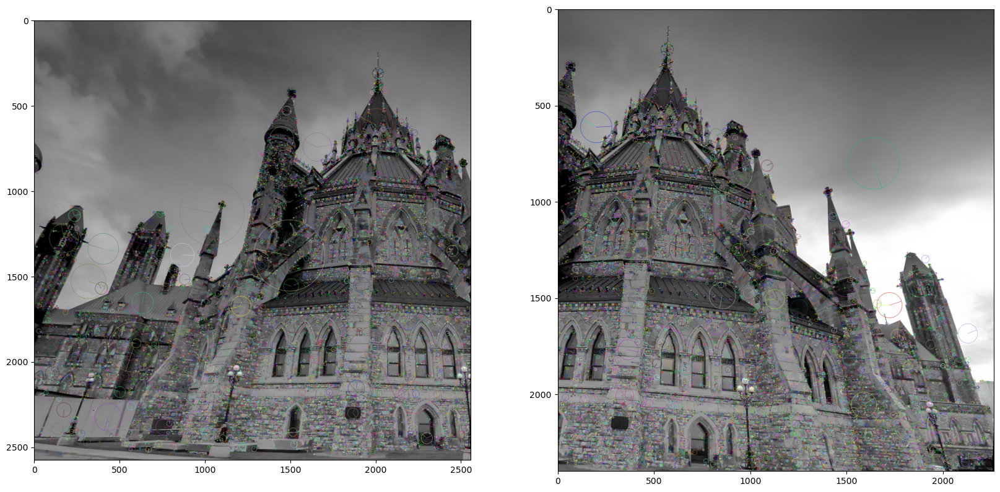

In [5]:
key_draw_right = cv2.drawKeypoints(img_left_gray, key_points_left, img_left_gray.copy(), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
key_draw_left = cv2.drawKeypoints(img_right_gray, key_points_right, img_right_gray.copy(), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 20))
ax[0].imshow(key_draw_right)
ax[1].imshow(key_draw_left)
plt.show()

### **Step 3: Match features**

In [6]:
distances, matches = K.feature.match_snn(torch.from_numpy(descriptor_left), torch.from_numpy(descriptor_right), th=0.3)
# sort the matches found in increasing order of their distance for next step
matches = matches[distances.view((-1,)).argsort(), :]
matches = matches.numpy()
print(matches.shape[0])

5736


### **Step 4: Prune features**

The function match_snn takes as input a threshold and only returns matches whose distance is less than that threshold, so some pruning is already done. We can further prune the matches by selecting only TOP_K of them.

In [7]:
TOP_K = 2000
matches = matches[:TOP_K]

In [8]:
inliers = np.zeros((matches.shape[0], 4), dtype=np.float32)

In [9]:
# Extract (x,y) coordinates from indices returned by match_snn
for k, (i, j) in enumerate(matches):
    x, y = key_points_left[i].pt
    inliers[k, 0], inliers[k, 1] = x, y
    x, y = key_points_right[j].pt
    inliers[k, 2], inliers[k, 3] = x, y

In [10]:
# Provided code for plotting inlier matches between two images

def plot_inlier_matches(ax, img1, img2, inliers):
    """
    Plot the matches between two images according to the matched keypoints
    :param ax: plot handle
    :param img1: left image
    :param img2: right image
    :inliers: x,y in the first image and x,y in the second image (Nx4)
    """
    
    # I pad images so that they're the same size
    if img1.shape[0] > img2.shape[0]:
        img2_temp = np.zeros((img1.shape[0], img2.shape[1]), dtype=img2.dtype)
        img2_temp[:img2.shape[0], :img2.shape[1]] = img2
        img2 = img2_temp
        
    if img2.shape[0] > img1.shape[0]:
        img1_temp = np.zeros((img2.shape[0], img1.shape[1]), dtype=img1.dtype)
        img1_temp[:img1.shape[0], :img1.shape[1]] = img1
        img1 = img1_temp
    
    if img1.shape[1] > img2.shape[1]:
        img2_temp = np.zeros((img1.shape[0], img1.shape[1]), dtype=img2.dtype)
        img2_temp[:img2.shape[0], :img2.shape[1]] = img2
        img2 = img2_temp
        
    if img2.shape[1] > img1.shape[1]:
        img1_temp = np.zeros((img2.shape[0], img2.shape[1]), dtype=img1.dtype)
        img1_temp[:img1.shape[0], :img1.shape[1]] = img1
        img1 = img1_temp
        
    res = np.hstack([img1, img2])
    ax.set_aspect('equal')
    ax.imshow(res, cmap='gray')
    
    ax.plot(inliers[:,0], inliers[:,1], '+r')
    ax.plot(inliers[:,2] + img1.shape[1], inliers[:,3], '+r')
    ax.plot([inliers[:,0], inliers[:,2] + img1.shape[1]],
            [inliers[:,1], inliers[:,3]], 'r', linewidth=0.4)
    ax.axis('off')

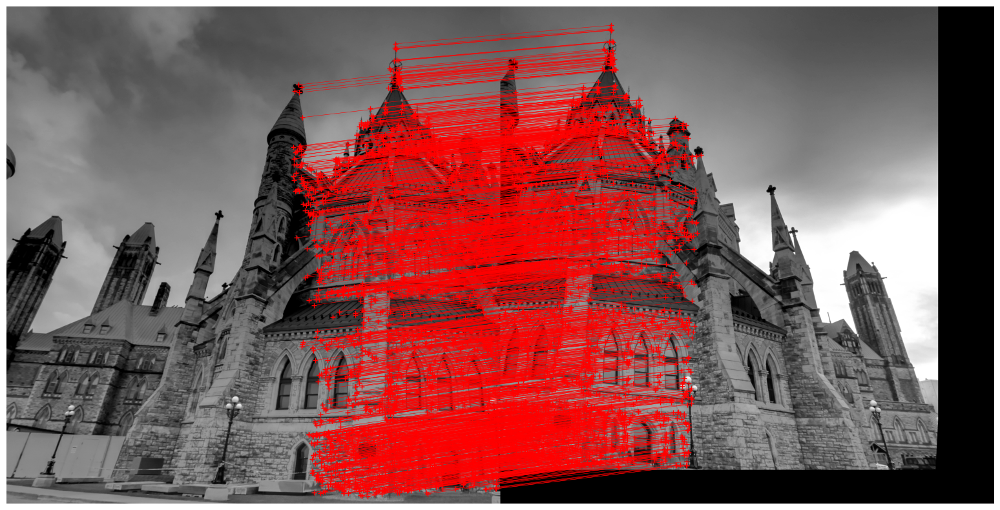

In [11]:
fig, ax = plt.subplots(figsize=(20,10))
plot_inlier_matches(ax, img_left_gray.copy(), img_right_gray.copy(), inliers)

### **Step 5: Robust transformation estimation**

For this part we first need to transform $x_2 = Tx_1 + c$ into a linear system (i.e., $Ax=b$). Assume $x_1 = (u_1, v_1)^T,$ $x_2 = (u_2, v_2)^T,$ $c = (c_1, c_2)^T$, and
$T = \begin{bmatrix}
    t_{11} & t_{12} \\
    t_{21} & t_{22} \\
\end{bmatrix}.
$

We have:
$$u_2 = t_{11}u_1 + t_{12}v_1 + c_1$$
and
$$v_2 = t_{21}u_1 + t_{22}v_1 + c_2$$.

We can transform the above equations into following equation:

$$
\begin{bmatrix}
    u_1 & v_1 & 0 & 0 & 1 & 0\\
    0 & 0 & u_1 & v_1 & 0 & 1\\
\end{bmatrix}
\begin{bmatrix}
    t_{11} \\ 
    t_{12} \\
    t_{21} \\
    t_{22} \\
    c_{1} \\
    c_{2}
\end{bmatrix}
=
\begin{bmatrix}
u_2\\
v_2\\
\end{bmatrix}
$$

As we have 6 variables, we need 6 equations. Thus, we need at least three pairs to estimate the variables. Denoting $i$th pair by $u_1^i, v_1^i, u_2^i, v_2^i$ we have:

$$
\begin{bmatrix}
    u_1^1 & v_1^1 & 0 & 0 & 1 & 0\\
    0 & 0 & u_1^1 & v_1^1 & 0 & 1\\
    u_1^2 & v_1^2 & 0 & 0 & 1 & 0\\
    0 & 0 & u_1^2 & v_1^2 & 0 & 1\\
    u_1^3 & v_1^3 & 0 & 0 & 1 & 0\\
    0 & 0 & u_1^3 & v_1^3 & 0 & 1\\
\end{bmatrix}
\begin{bmatrix}
    t_{11} \\ 
    t_{12} \\
    t_{21} \\
    t_{22} \\
    c_{1} \\
    c_{2}
\end{bmatrix}
=
\begin{bmatrix}
u_2^1\\
v_2^1\\
u_2^2\\
v_2^2\\
u_2^3\\
v_2^3\\
\end{bmatrix}
$$

In [12]:
# PARAMETERS

# As stated above, the minimum number of pairs required is 3
MINIMUM_NUM_PAIRS = 3
# RANSACT Iterations
# Reduce this value to run the code faster
N = 50000
# radius rho
rho = 0.01

In [13]:
# This variable is used to keep the inliers of the best model
max_number_of_inliers = 0
# The inliers of the best model are saved in this variable
final_inliers_indices = None

for i in range(N):
    # Sample MINIMUM_NUM_PAIRS pairs
    indices = np.random.randint(0, inliers.shape[0], 3)
    # Create the matrix A using the definition above
    A = np.array([[inliers[indices[0], 0], inliers[indices[0], 1], 0, 0, 1, 0],
                  [0, 0, inliers[indices[0], 0], inliers[indices[0], 1], 0, 1],
                  [inliers[indices[1], 0], inliers[indices[1], 1], 0, 0, 1, 0],
                  [0, 0, inliers[indices[1], 0], inliers[indices[1], 1], 0, 1],
                  [inliers[indices[2], 0], inliers[indices[2], 1], 0, 0, 1, 0],
                  [0, 0, inliers[indices[2], 0], inliers[indices[2], 1], 0, 1]])
    # Create the matrix b using the definition above
    b = np.array([inliers[indices[0], 2], inliers[indices[0], 3], inliers[indices[1], 2], inliers[indices[1], 3], inliers[indices[2], 2], inliers[indices[2], 3]]).reshape((-1, 1))
    try:
        # Solve Ax=b by x=inv(A)b
        t11, t12, t21, t22, c1, c2 = (np.linalg.inv(A) @ b).reshape((-1,))
    except:
        # if A is singular and noninvertible ignore this iteration
        continue

    T = np.array([[t11, t12], [t21, t22]])
    c = np.array([[c1], [c2]])
    # Map the input coordinates to output coordinates using the tranformation
    transformed = T @ inliers[:, :2].transpose() + c
    transformed = transformed.transpose()
    # Compute the difference and norm
    diff = transformed - inliers[:, 2:]
    diff2 = np.square(diff)
    norm = np.sum(diff2, axis=1)
    norm = np.sqrt(norm)
    # Find the number of inliers
    n_inliers = np.sum(norm < rho)
    # if the number of inliers is greater than previous maximum number of inliers,
    # store the inliers otherwise do nothing
    if n_inliers > max_number_of_inliers:
        final_inliers_indices = np.argwhere(norm < rho).reshape((-1,))
        max_number_of_inliers = n_inliers

### **Step 6: Compute optimal transformation**

In [14]:
# Use all of the inliers of the best model from RANSAC to find the transformation
# The steps are similar to above, but instead of inv(A) use inv(A^TA)A^T
final_inliers = inliers[final_inliers_indices, :]
A = np.zeros((2*final_inliers.shape[0], 6))
b = np.zeros((2*final_inliers.shape[0], 1))

for i in range(final_inliers.shape[0]):
    
    A[2*i, :] = np.array([final_inliers[i, 0], final_inliers[i, 1], 0, 0, 1, 0])
    A[2*i+1, :] = np.array([0, 0, final_inliers[i, 0], final_inliers[i, 1], 0, 1])
    
    b[2*i] = final_inliers[i, 2]
    b[2*i+1] = final_inliers[i, 3]
    
t11, t12, t21, t22, c1, c2 = (np.linalg.inv(A.transpose() @ A) @ A.transpose() @ b).reshape((-1,))

In [15]:
T = np.array([[t11, t12], [t21, t22]])
c = np.array([[c1], [c2]])

In [16]:
T, c

(array([[ 0.97823324, -0.05128891],
        [ 0.05124756,  0.97821798]]),
 array([[-1387.29346127],
        [ -194.79195209]]))

### **Step 7: Create panaroma**

In [17]:
H = np.array([[t11, t12, c1], [t21, t22, c2], [0, 0, 1]])
H

array([[ 9.78233239e-01, -5.12889134e-02, -1.38729346e+03],
       [ 5.12475616e-02,  9.78217982e-01, -1.94791952e+02],
       [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]])

In [18]:
img_left = plt.imread('parliament-left.jpg')
img_right = plt.imread('parliament-right.jpg')
img_right = img_right.astype(np.float32) / 255
img_left = img_left.astype(np.float32) / 255

In [19]:
# Warp the right image
transform = skimage.transform.ProjectiveTransform(H)
right_warped = skimage.transform.warp(img_right, transform, output_shape=(5000, 5000), order=3) # Note that this function takes the inverse transform as input so we should warp the right image

In [20]:
# Combine the images
right_warped[:img_left.shape[0], :img_left.shape[1]] = np.maximum(img_left, right_warped[:img_left.shape[0], :img_left.shape[1]])

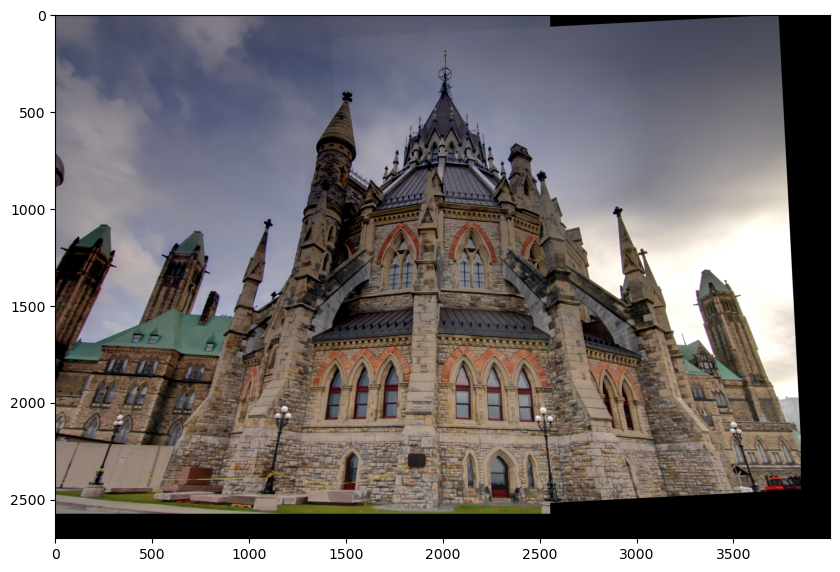

In [21]:
plt.figure(figsize=(10, 20))
plt.imshow(right_warped[:2700, :4000])
plt.show()

## Part B

### Provided Images

### **Step 1: Preprocessing**

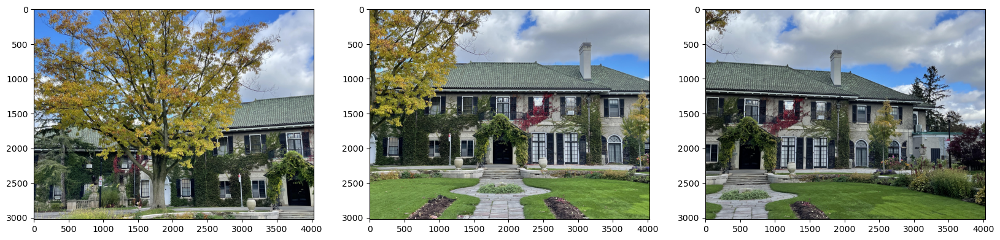

In [22]:
img1 = plt.imread('Glendon-Hall-left.jpg')
img2 = plt.imread('Glendon-Hall-middle.jpg')
img3 = plt.imread('Glendon-Hall-right.jpg')

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 10))
ax[0].imshow(img1)
ax[1].imshow(img2)
ax[2].imshow(img3)
plt.show()

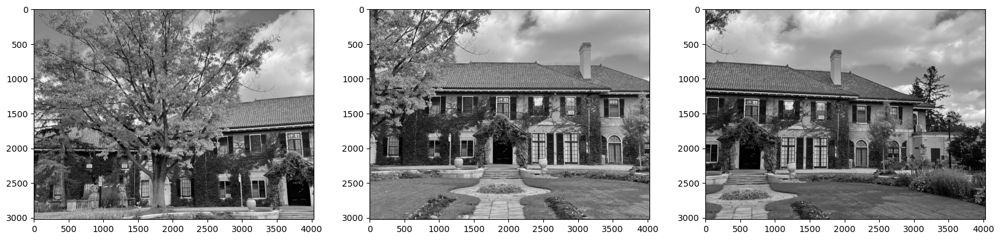

In [23]:
gray1 = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)
gray3 = cv2.cvtColor(img3, cv2.COLOR_RGB2GRAY)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 10))
ax[0].imshow(gray1, 'gray')
ax[1].imshow(gray2, 'gray')
ax[2].imshow(gray3, 'gray')
plt.show()

### **Step 2: Detect keypoints**

The number of keypoints returned is too many which results in a memory error when I want to calculate their distances in the next part. So, I reduce the number of keypoints by masking out the ones that have low response

In [24]:
# For this part, SIFT returns around 200k keypoints and if I use them all in cdist, then
# I'll get memory error. So, I had to reduce the number of points. As I read on
# the internet, keypoint.response is a good indicator of how good a keypoint is.
# So, I take only top 50k keypoints based on this response.
key_points1, descriptor1 = cv2.SIFT.create().detectAndCompute(gray1, None)
key_points2, descriptor2 = cv2.SIFT.create().detectAndCompute(gray2, None)
key_points3, descriptor3 = cv2.SIFT.create().detectAndCompute(gray3, None)
response1 = np.array([keypoint.response for keypoint in key_points1])
response2 = np.array([keypoint.response for keypoint in key_points2])
response3 = np.array([keypoint.response for keypoint in key_points3])
good_keypoints_idx1 = np.argsort(response1)[-50000:]
good_keypoints_idx2 = np.argsort(response2)[-50000:]
good_keypoints_idx3 = np.argsort(response3)[-50000:]
key_points1 = [key_points1[i] for i in good_keypoints_idx1]
key_points2 = [key_points2[i] for i in good_keypoints_idx2]
key_points3 = [key_points3[i] for i in good_keypoints_idx3]
descriptor1 = descriptor1[good_keypoints_idx1, :]
descriptor2 = descriptor2[good_keypoints_idx2, :]
descriptor3 = descriptor3[good_keypoints_idx3, :]

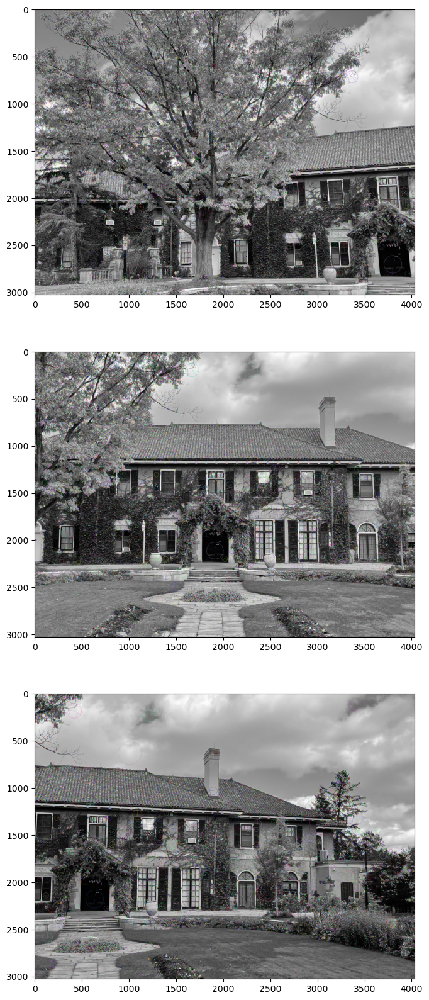

In [25]:
key_draw1 = cv2.drawKeypoints(gray1, key_points1, gray1.copy(), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
key_draw2 = cv2.drawKeypoints(gray2, key_points2, gray2.copy(), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
key_draw3 = cv2.drawKeypoints(gray3, key_points3, gray3.copy(), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(20, 20))
ax[0].imshow(key_draw1)
ax[1].imshow(key_draw2)
ax[2].imshow(key_draw3)
plt.show()

### **Step 3: Match features**

In [26]:
distances12, matches12 = K.feature.match_snn(torch.from_numpy(descriptor1), torch.from_numpy(descriptor2), th=0.5)
distances23, matches23 = K.feature.match_snn(torch.from_numpy(descriptor2), torch.from_numpy(descriptor3), th=0.5)

# sort the matches found in increasing order of their distance for next step
matches12 = matches12[distances12.view((-1,)).argsort(), :]
matches12 = matches12.numpy()
print(matches12.shape[0])
matches23 = matches23[distances23.view((-1,)).argsort(), :]
matches23 = matches23.numpy()
print(matches23.shape[0])

1570
2619


### **Step 4: Prune features**

In [27]:
TOP_K = 2000
matches12 = matches12[:TOP_K]
matches23 = matches23[:TOP_K]

In [28]:
inliers12 = np.zeros((matches12.shape[0], 4), dtype=np.float32)
inliers23 = np.zeros((matches23.shape[0], 4), dtype=np.float32)

In [29]:
for k, (i, j) in enumerate(matches12):
    x, y = key_points1[i].pt
    inliers12[k, 0], inliers12[k, 1] = x, y
    x, y = key_points2[j].pt
    inliers12[k, 2], inliers12[k, 3] = x, y

In [30]:
# Provided code for plotting inlier matches between two images

def plot_inlier_matches(ax, img1, img2, inliers):
    """
    Plot the matches between two images according to the matched keypoints
    :param ax: plot handle
    :param img1: left image
    :param img2: right image
    :inliers: x,y in the first image and x,y in the second image (Nx4)
    """
    if img1.shape[0] > img2.shape[0]:
        img2_temp = np.zeros((img1.shape[0], img2.shape[1]), dtype=img2.dtype)
        img2_temp[:img2.shape[0], :img2.shape[1]] = img2
        img2 = img2_temp
        
    if img2.shape[0] > img1.shape[0]:
        img1_temp = np.zeros((img2.shape[0], img1.shape[1]), dtype=img1.dtype)
        img1_temp[:img1.shape[0], :img1.shape[1]] = img1
        img1 = img1_temp
    
    if img1.shape[1] > img2.shape[1]:
        img2_temp = np.zeros((img1.shape[0], img1.shape[1]), dtype=img2.dtype)
        img2_temp[:img2.shape[0], :img2.shape[1]] = img2
        img2 = img2_temp
        
    if img2.shape[1] > img1.shape[1]:
        img1_temp = np.zeros((img2.shape[0], img2.shape[1]), dtype=img1.dtype)
        img1_temp[:img1.shape[0], :img1.shape[1]] = img1
        img1 = img1_temp
        
    res = np.hstack([img1, img2])
    ax.set_aspect('equal')
    ax.imshow(res, cmap='gray')
    
    ax.plot(inliers[:,0], inliers[:,1], '+r')
    ax.plot(inliers[:,2] + img1.shape[1], inliers[:,3], '+r')
    ax.plot([inliers[:,0], inliers[:,2] + img1.shape[1]],
            [inliers[:,1], inliers[:,3]], 'r', linewidth=0.4)
    ax.axis('off')

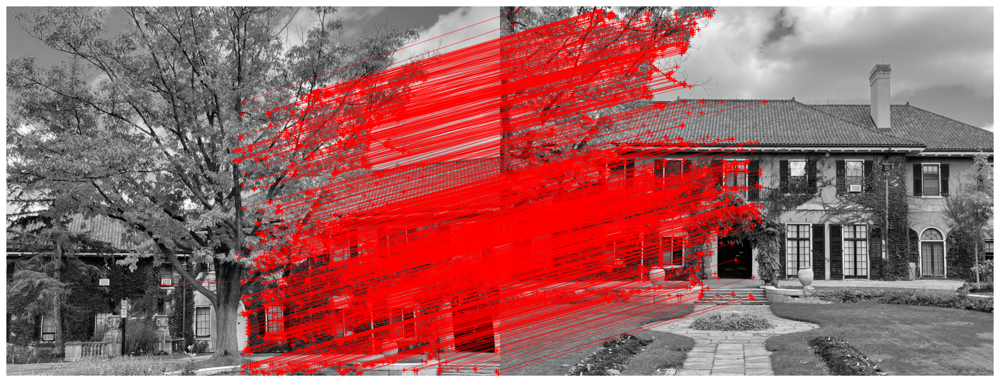

In [31]:
fig, ax = plt.subplots(figsize=(20,10))
plot_inlier_matches(ax, gray1.copy(), gray2.copy(), inliers12)

In [32]:
for k, (i, j) in enumerate(matches23):
    x, y = key_points2[i].pt
    inliers23[k, 0], inliers23[k, 1] = x, y
    x, y = key_points3[j].pt
    inliers23[k, 2], inliers23[k, 3] = x, y

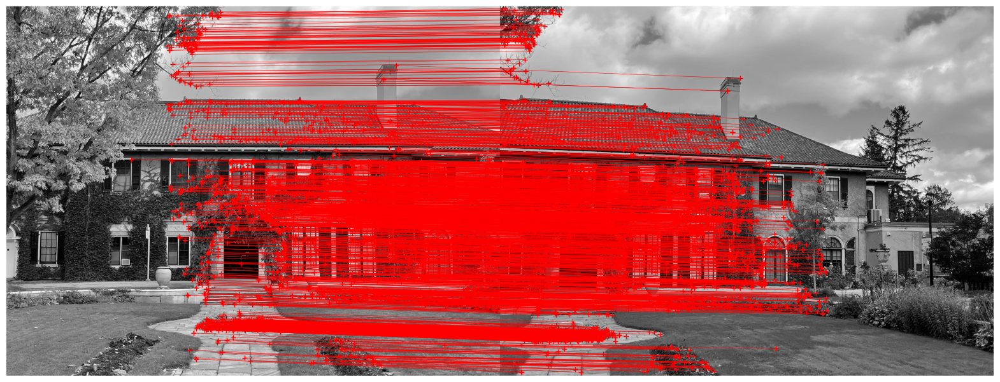

In [33]:
fig, ax = plt.subplots(figsize=(20,10))
plot_inlier_matches(ax, gray2.copy(), gray3.copy(), inliers23)

### **Step 5: Robust transformation estimation**

In [34]:
# padding
# The left and upper parts of the left image will be removed because they'll have
# negative coordinates after warping. To avoid this I add some zeros to the left and
# right of images. This is equivalent to shifting the inliers coordinates
padding_size = 3000
inliers12 += padding_size
inliers23 += padding_size

In [35]:
# PARAMETERS

# As stated above, the minimum number of pairs required is 3
MINIMUM_NUM_PAIRS = 4
# RANSACT Iterations
# Decrease to run the code faster
N = 50000
# radius rho
rho = 1

In [36]:
def FindFinalInliers(inliers_, MINIMUM_NUM_PAIRS=4, N=10000, rho = 1):
    max_number_of_inliers = 0
    final_inliers_indices = None

    for i in range(N):

        indices = np.random.randint(0, inliers_.shape[0], MINIMUM_NUM_PAIRS)
        
        A = np.zeros((2*MINIMUM_NUM_PAIRS, 9), dtype=np.float32)

        for j, idx in enumerate(indices):
            A[2*j, :] = np.array([inliers_[idx, 0], inliers_[idx, 1], 1, 0, 0, 0, -inliers_[idx, 0]*inliers_[idx, 2], -inliers_[idx, 1]*inliers_[idx, 2], -inliers_[idx, 2]])
            A[2*j+1, :] = np.array([0, 0, 0, inliers_[idx, 0], inliers_[idx, 1], 1, -inliers_[idx, 0]*inliers_[idx, 3], -inliers_[idx, 1]*inliers_[idx, 3], -inliers_[idx, 3]])

        U, S, V = np.linalg.svd(A)
        hstar = V[len(V)-1]
        H = hstar.reshape((3, 3))
        transformed = H @ np.concatenate((inliers_[:, :2].transpose(), np.ones((1, inliers_.shape[0]))), axis=0)
        transformed[0, :] /= transformed[2, :]
        transformed[1, :] /= transformed[2, :]
        transformed = transformed[:2, :].transpose()
        diff = transformed - inliers_[:, 2:]
        diff2 = np.square(diff)
        norm = np.sum(diff2, axis=1)
        norm = np.sqrt(norm)
        
        n_inliers = np.sum(norm < rho)

        if n_inliers > max_number_of_inliers:
            final_inliers_indices = np.argwhere(norm < rho).reshape((-1,))
            max_number_of_inliers = n_inliers
    return final_inliers_indices

In [37]:
final_inliers_idx12 = FindFinalInliers(inliers12, MINIMUM_NUM_PAIRS, N, rho)
final_inliers_idx23 = FindFinalInliers(inliers23, MINIMUM_NUM_PAIRS, N, rho)

In [38]:
final_inliers_idx12.shape[0], final_inliers_idx23.shape[0]

(472, 599)

### **Step 6: Compute optimal transformation**

In [39]:
def FindHomography(final_inliers):
    A = np.zeros((2*final_inliers.shape[0], 9), dtype=np.float32)

    for i in range(final_inliers.shape[0]):

        A[2*i, :] = np.array([final_inliers[i, 0], final_inliers[i, 1], 1, 0, 0, 0, -final_inliers[i, 0]*final_inliers[i, 2], -final_inliers[i, 1]*final_inliers[i, 2], -final_inliers[i, 2]])
        A[2*i+1, :] = np.array([0, 0, 0, final_inliers[i, 0], final_inliers[i, 1], 1, -final_inliers[i, 0]*final_inliers[i, 3], -final_inliers[i, 1]*final_inliers[i, 3], -final_inliers[i, 3]])

    U, S, V = np.linalg.svd(A)
    hstar = V[len(V)-1]
    H = hstar.reshape((3, 3))
    return H

In [40]:
final_inliers12 = inliers12[final_inliers_idx12, :]
final_inliers23 = inliers23[final_inliers_idx23, :]

H12 = FindHomography(final_inliers12)
H23 = FindHomography(final_inliers23)
print(H12)
print(H23)

[[-2.6878613e-04 -1.0393903e-06  7.4687988e-01]
 [-8.0666679e-05 -2.1918173e-04  6.6495883e-01]
 [-1.5798229e-08 -3.9309480e-09 -9.1958937e-05]]
[[-4.3264715e-04  1.3635778e-05  8.5858154e-01]
 [-9.9863304e-05 -3.3819088e-04  5.1267666e-01]
 [-2.0108745e-08  1.2639152e-09 -2.3690431e-04]]


In [41]:
# check with opencv result
hopencv, _ = cv2.findHomography(inliers12[:, :2], inliers12[:, 2:], cv2.RANSAC)
print(hopencv)
H12_normalized = H12 / H12[2,2]
print(H12_normalized)

[[ 3.07168885e+00  7.19188290e-02 -8.88123828e+03]
 [ 9.22235876e-01  2.54484454e+00 -7.84553072e+03]
 [ 1.80284159e-04  5.35313151e-05  1.00000000e+00]]
[[ 2.9228930e+00  1.1302765e-02 -8.1218848e+03]
 [ 8.7720329e-01  2.3834739e+00 -7.2310410e+03]
 [ 1.7179655e-04  4.2746775e-05  1.0000000e+00]]


### **Step 7: Create panaroma**

In [42]:
img1 = plt.imread('Glendon-Hall-left.jpg')
img2 = plt.imread('Glendon-Hall-middle.jpg')
img3 = plt.imread('Glendon-Hall-right.jpg')
img1 = img1.astype(np.float32) / 255
img2 = img2.astype(np.float32) / 255
img3 = img3.astype(np.float32) / 255
img1_padded = np.pad(img1, ((padding_size, 2000), (padding_size, 2000), (0, 0)), 'constant')
img2_padded = np.pad(img2, ((padding_size, 2000), (padding_size, 2000), (0, 0)), 'constant')
img3_padded = np.pad(img3, ((padding_size, 2000), (padding_size, 2000), (0, 0)), 'constant')

In [43]:
transform = skimage.transform.ProjectiveTransform(np.linalg.inv(H12))
img1_warped = skimage.transform.warp(img1_padded, transform, output_shape=(10000, 10000), order=3)

In [44]:
img1_warped[:img2_padded.shape[0], :img2_padded.shape[1]][img2_padded > 0] = img2_padded[img2_padded > 0]

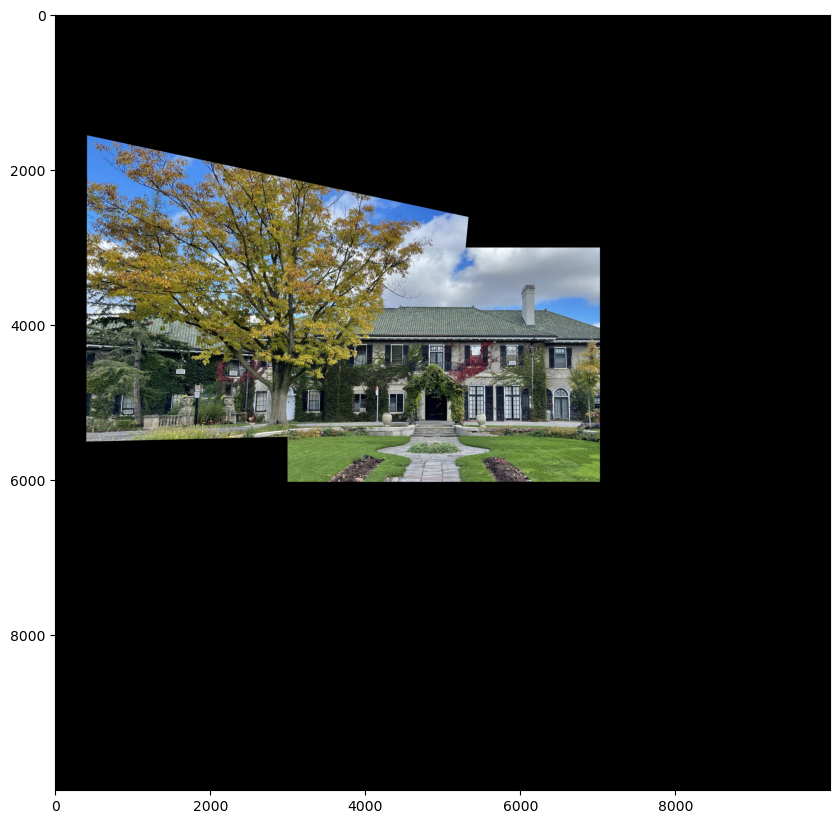

In [45]:
plt.figure(figsize=(10, 20))
plt.imshow(img1_warped)
plt.show()

In [46]:
transform = skimage.transform.ProjectiveTransform(H23)
img3_warped = skimage.transform.warp(img3_padded, transform, output_shape=(10000, 10000), order=3)

In [47]:
img3_warped[img1_warped > 0] = img1_warped[img1_warped > 0]
# img3_warped = np.maximum(img3_warped, img1_warped)

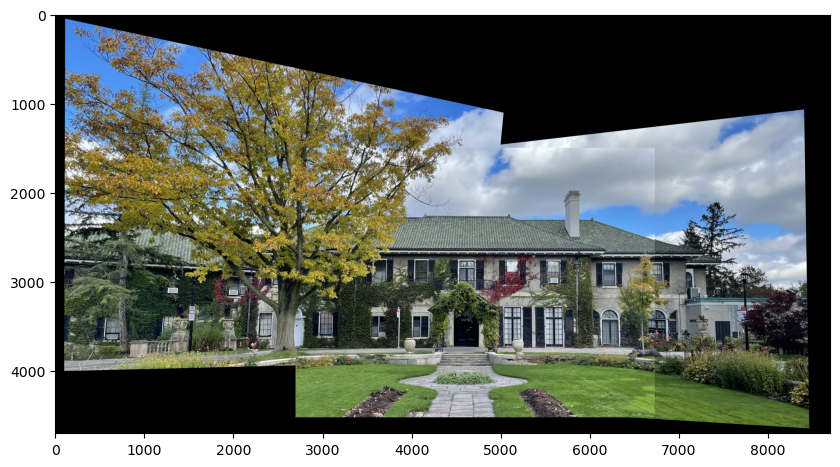

In [48]:
plt.figure(figsize=(10, 20))
plt.imshow(img3_warped[1500:6200, 300:9000])
plt.show()

### My images

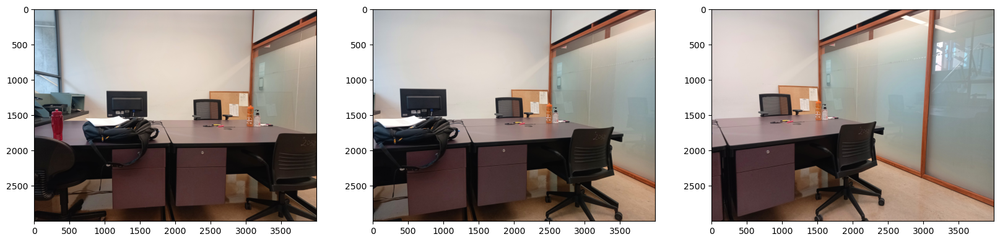

In [49]:
img1 = plt.imread('img_left.jpg')
img2 = plt.imread('img_middle.jpg')
img3 = plt.imread('img_right.jpg')
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 10))
ax[0].imshow(img1)
ax[1].imshow(img2)
ax[2].imshow(img3)
plt.show()

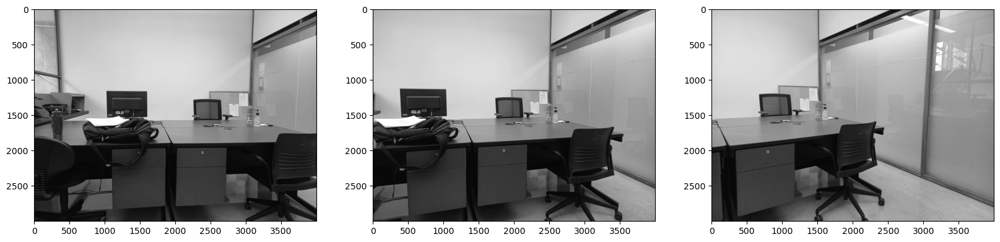

In [50]:
gray1 = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)
gray3 = cv2.cvtColor(img3, cv2.COLOR_RGB2GRAY)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 10))
ax[0].imshow(gray1, 'gray')
ax[1].imshow(gray2, 'gray')
ax[2].imshow(gray3, 'gray')
plt.show()

### **Step 2: Detect keypoints**

The number of keypoints returned is too many which results in a memory error when I want to calculate their distances in the next part. So, I reduce the number of keypoints by masking out the ones that have low response

In [51]:
key_points1, descriptor1 = cv2.SIFT.create().detectAndCompute(gray1, None)
key_points2, descriptor2 = cv2.SIFT.create().detectAndCompute(gray2, None)
key_points3, descriptor3 = cv2.SIFT.create().detectAndCompute(gray3, None)
response1 = np.array([keypoint.response for keypoint in key_points1])
response2 = np.array([keypoint.response for keypoint in key_points2])
response3 = np.array([keypoint.response for keypoint in key_points3])
good_keypoints_idx1 = np.argsort(response1)[-50000:]
good_keypoints_idx2 = np.argsort(response2)[-50000:]
good_keypoints_idx3 = np.argsort(response3)[-50000:]
key_points1 = [key_points1[i] for i in good_keypoints_idx1]
key_points2 = [key_points2[i] for i in good_keypoints_idx2]
key_points3 = [key_points3[i] for i in good_keypoints_idx3]
descriptor1 = descriptor1[good_keypoints_idx1, :]
descriptor2 = descriptor2[good_keypoints_idx2, :]
descriptor3 = descriptor3[good_keypoints_idx3, :]

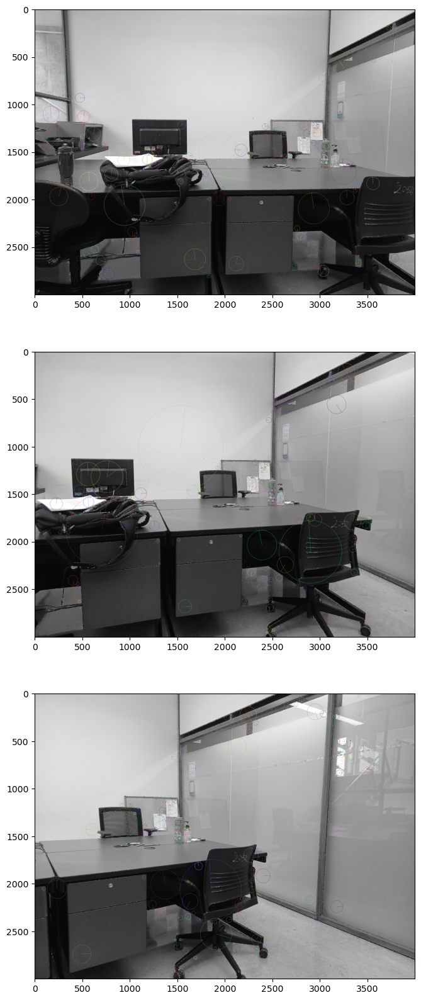

In [52]:
key_draw1 = cv2.drawKeypoints(gray1, key_points1, gray1.copy(), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
key_draw2 = cv2.drawKeypoints(gray2, key_points2, gray2.copy(), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
key_draw3 = cv2.drawKeypoints(gray3, key_points3, gray3.copy(), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(20, 20))
ax[0].imshow(key_draw1)
ax[1].imshow(key_draw2)
ax[2].imshow(key_draw3)
plt.show()

### **Step 3: Match features**

In [53]:
distances12, matches12 = K.feature.match_snn(torch.from_numpy(descriptor1), torch.from_numpy(descriptor2), th=0.5)
distances23, matches23 = K.feature.match_snn(torch.from_numpy(descriptor2), torch.from_numpy(descriptor3), th=0.5)

# sort the matches found in increasing order of their distance for next step
matches12 = matches12[distances12.view((-1,)).argsort(), :]
matches12 = matches12.numpy()
print(matches12.shape[0])
matches23 = matches23[distances23.view((-1,)).argsort(), :]
matches23 = matches23.numpy()
print(matches23.shape[0])

663
319


### **Step 4: Prune features**

In [54]:
TOP_K = 2000
matches12 = matches12[:TOP_K]
matches23 = matches23[:TOP_K]

In [55]:
inliers12 = np.zeros((matches12.shape[0], 4), dtype=np.float32)
inliers23 = np.zeros((matches23.shape[0], 4), dtype=np.float32)

In [56]:
for k, (i, j) in enumerate(matches12):
    x, y = key_points1[i].pt
    inliers12[k, 0], inliers12[k, 1] = x, y
    x, y = key_points2[j].pt
    inliers12[k, 2], inliers12[k, 3] = x, y

In [57]:
# Provided code for plotting inlier matches between two images

def plot_inlier_matches(ax, img1, img2, inliers):
    """
    Plot the matches between two images according to the matched keypoints
    :param ax: plot handle
    :param img1: left image
    :param img2: right image
    :inliers: x,y in the first image and x,y in the second image (Nx4)
    """
    if img1.shape[0] > img2.shape[0]:
        img2_temp = np.zeros((img1.shape[0], img2.shape[1]), dtype=img2.dtype)
        img2_temp[:img2.shape[0], :img2.shape[1]] = img2
        img2 = img2_temp
        
    if img2.shape[0] > img1.shape[0]:
        img1_temp = np.zeros((img2.shape[0], img1.shape[1]), dtype=img1.dtype)
        img1_temp[:img1.shape[0], :img1.shape[1]] = img1
        img1 = img1_temp
    
    if img1.shape[1] > img2.shape[1]:
        img2_temp = np.zeros((img1.shape[0], img1.shape[1]), dtype=img2.dtype)
        img2_temp[:img2.shape[0], :img2.shape[1]] = img2
        img2 = img2_temp
        
    if img2.shape[1] > img1.shape[1]:
        img1_temp = np.zeros((img2.shape[0], img2.shape[1]), dtype=img1.dtype)
        img1_temp[:img1.shape[0], :img1.shape[1]] = img1
        img1 = img1_temp
        
    res = np.hstack([img1, img2])
    ax.set_aspect('equal')
    ax.imshow(res, cmap='gray')
    
    ax.plot(inliers[:,0], inliers[:,1], '+r')
    ax.plot(inliers[:,2] + img1.shape[1], inliers[:,3], '+r')
    ax.plot([inliers[:,0], inliers[:,2] + img1.shape[1]],
            [inliers[:,1], inliers[:,3]], 'r', linewidth=0.4)
    ax.axis('off')

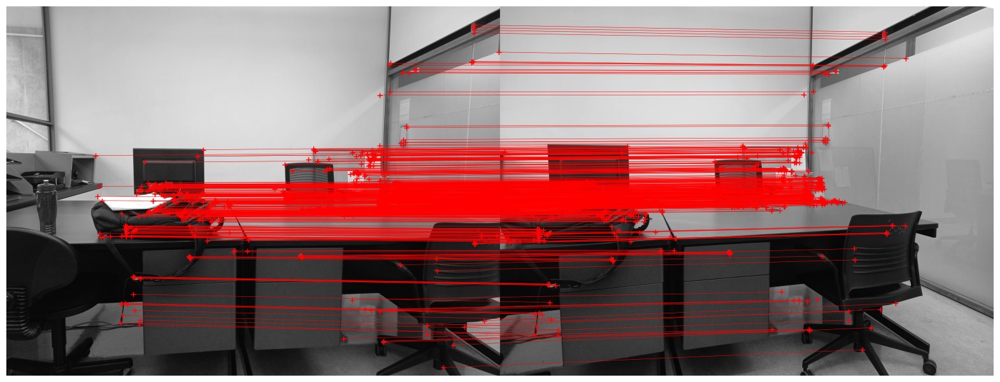

In [58]:
fig, ax = plt.subplots(figsize=(20,10))
plot_inlier_matches(ax, gray1.copy(), gray2.copy(), inliers12)

In [59]:
for k, (i, j) in enumerate(matches23):
    x, y = key_points2[i].pt
    inliers23[k, 0], inliers23[k, 1] = x, y
    x, y = key_points3[j].pt
    inliers23[k, 2], inliers23[k, 3] = x, y

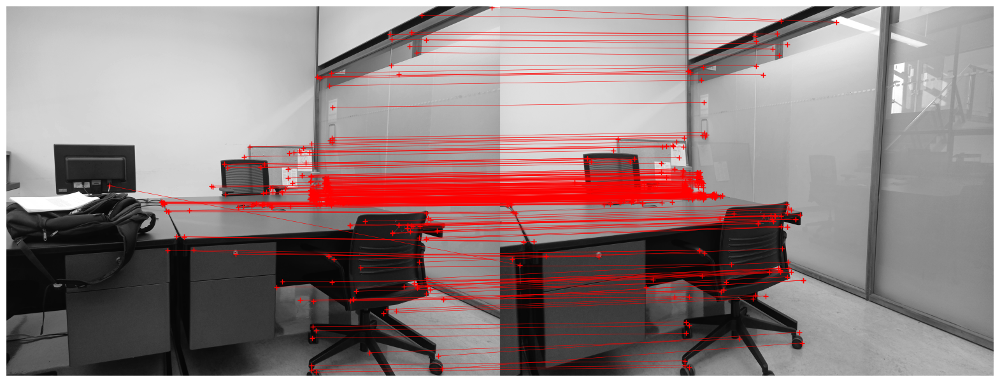

In [60]:
fig, ax = plt.subplots(figsize=(20,10))
plot_inlier_matches(ax, gray2.copy(), gray3.copy(), inliers23)

### **Step 5: Robust transformation estimation**

In [61]:
# padding
padding_size = 3000
inliers12 += padding_size
inliers23 += padding_size

In [62]:
# PARAMETERS

# As stated above, the minimum number of pairs required is 3
MINIMUM_NUM_PAIRS = 4
# RANSACT Iterations
# Decrease to run the code faster
N = 10000
# radius rho
rho = 1

In [63]:
def FindFinalInliers(inliers_, MINIMUM_NUM_PAIRS=4, N=10000, rho = 1):
    max_number_of_inliers = 0
    final_inliers_indices = None

    for i in range(N):

        indices = np.random.randint(0, inliers_.shape[0], MINIMUM_NUM_PAIRS)
        
        A = np.zeros((2*MINIMUM_NUM_PAIRS, 9), dtype=np.float32)

        for j, idx in enumerate(indices):
            A[2*j, :] = np.array([inliers_[idx, 0], inliers_[idx, 1], 1, 0, 0, 0, -inliers_[idx, 0]*inliers_[idx, 2], -inliers_[idx, 1]*inliers_[idx, 2], -inliers_[idx, 2]])
            A[2*j+1, :] = np.array([0, 0, 0, inliers_[idx, 0], inliers_[idx, 1], 1, -inliers_[idx, 0]*inliers_[idx, 3], -inliers_[idx, 1]*inliers_[idx, 3], -inliers_[idx, 3]])

        U, S, V = np.linalg.svd(A)
        hstar = V[len(V)-1]
        H = hstar.reshape((3, 3))
        transformed = H @ np.concatenate((inliers_[:, :2].transpose(), np.ones((1, inliers_.shape[0]))), axis=0)
        transformed[0, :] /= transformed[2, :]
        transformed[1, :] /= transformed[2, :]
        transformed = transformed[:2, :].transpose()
        diff = transformed - inliers_[:, 2:]
        diff2 = np.square(diff)
        norm = np.sum(diff2, axis=1)
        norm = np.sqrt(norm)
        n_inliers = np.sum(norm < rho)

        if n_inliers > max_number_of_inliers:
            final_inliers_indices = np.argwhere(norm < rho).reshape((-1,))
            max_number_of_inliers = n_inliers
    return final_inliers_indices

In [64]:
final_inliers_idx12 = FindFinalInliers(inliers12, MINIMUM_NUM_PAIRS, N, rho)
final_inliers_idx23 = FindFinalInliers(inliers23, MINIMUM_NUM_PAIRS, N, rho)

In [65]:
final_inliers_idx12.shape[0], final_inliers_idx23.shape[0]

(226, 174)

### **Step 6: Compute optimal transformation**

In [66]:
def FindHomography(final_inliers):
    A = np.zeros((2*final_inliers.shape[0], 9), dtype=np.float32)

    for i in range(final_inliers.shape[0]):

        A[2*i, :] = np.array([final_inliers[i, 0], final_inliers[i, 1], 1, 0, 0, 0, -final_inliers[i, 0]*final_inliers[i, 2], -final_inliers[i, 1]*final_inliers[i, 2], -final_inliers[i, 2]])
        A[2*i+1, :] = np.array([0, 0, 0, final_inliers[i, 0], final_inliers[i, 1], 1, -final_inliers[i, 0]*final_inliers[i, 3], -final_inliers[i, 1]*final_inliers[i, 3], -final_inliers[i, 3]])

    U, S, V = np.linalg.svd(A)
    hstar = V[len(V)-1]
    H = hstar.reshape((3, 3))
    return H

In [67]:
final_inliers12 = inliers12[final_inliers_idx12, :]
final_inliers23 = inliers23[final_inliers_idx23, :]

H12 = FindHomography(final_inliers12)
H23 = FindHomography(final_inliers23)
print(H12)
print(H23)

[[-4.5223089e-04 -1.8360797e-05  8.2720923e-01]
 [-9.5156181e-05 -3.5677219e-04  5.6189370e-01]
 [-2.2571355e-08 -2.5371814e-09 -2.1492658e-04]]
[[ 2.9456124e-04  8.3175037e-06 -8.1251341e-01]
 [ 1.0053182e-04  1.9190171e-04 -5.8294237e-01]
 [ 2.3470342e-08  8.6249580e-10  5.4075055e-05]]


In [68]:
# check with opencv result
hopencv, _ = cv2.findHomography(inliers12[:, :2], inliers12[:, 2:], cv2.RANSAC)
print(hopencv)
H12_normalized = H12 / H12[2,2]
print(H12_normalized)

[[ 2.12465119e+00 -5.46789809e-02 -3.46798965e+03]
 [ 4.92525011e-01  1.54678735e+00 -2.51088210e+03]
 [ 1.16008470e-04 -8.15901736e-06  1.00000000e+00]]
[[ 2.1041181e+00  8.5428230e-02 -3.8487991e+03]
 [ 4.4273809e-01  1.6599724e+00 -2.6143518e+03]
 [ 1.0501891e-04  1.1804875e-05  1.0000000e+00]]


In [69]:
# check with opencv result
hopencv, _ = cv2.findHomography(inliers23[:, :2], inliers23[:, 2:], cv2.RANSAC)
print(hopencv)
H23_normalized = H23 / H23[2,2]
print(H23_normalized)

[[ 4.19674195e+00  8.83839492e-02 -1.10310189e+04]
 [ 1.33418069e+00  2.80326781e+00 -7.67221361e+03]
 [ 3.12982973e-04  7.61850766e-06  1.00000000e+00]]
[[ 5.4472666e+00  1.5381406e-01 -1.5025660e+04]
 [ 1.8591163e+00  3.5488029e+00 -1.0780245e+04]
 [ 4.3403270e-04  1.5949976e-05  1.0000000e+00]]


### **Step 7: Create panaroma**

In [70]:
img1 = plt.imread('img_left.jpg')
img2 = plt.imread('img_middle.jpg')
img3 = plt.imread('img_right.jpg')
img1 = img1.astype(np.float32) / 255
img2 = img2.astype(np.float32) / 255
img3 = img3.astype(np.float32) / 255
img1_padded = np.pad(img1, ((padding_size, 2000), (padding_size, 2000), (0, 0)), 'constant')
img2_padded = np.pad(img2, ((padding_size, 2000), (padding_size, 2000), (0, 0)), 'constant')
img3_padded = np.pad(img3, ((padding_size, 2000), (padding_size, 2000), (0, 0)), 'constant')

In [71]:
transform = skimage.transform.ProjectiveTransform(np.linalg.inv(H12))
img1_warped = skimage.transform.warp(img1_padded, transform, output_shape=(10000, 10000), order=3)

In [72]:
img1_warped[:img2_padded.shape[0], :img2_padded.shape[1]][img2_padded > 0] = img2_padded[img2_padded > 0]

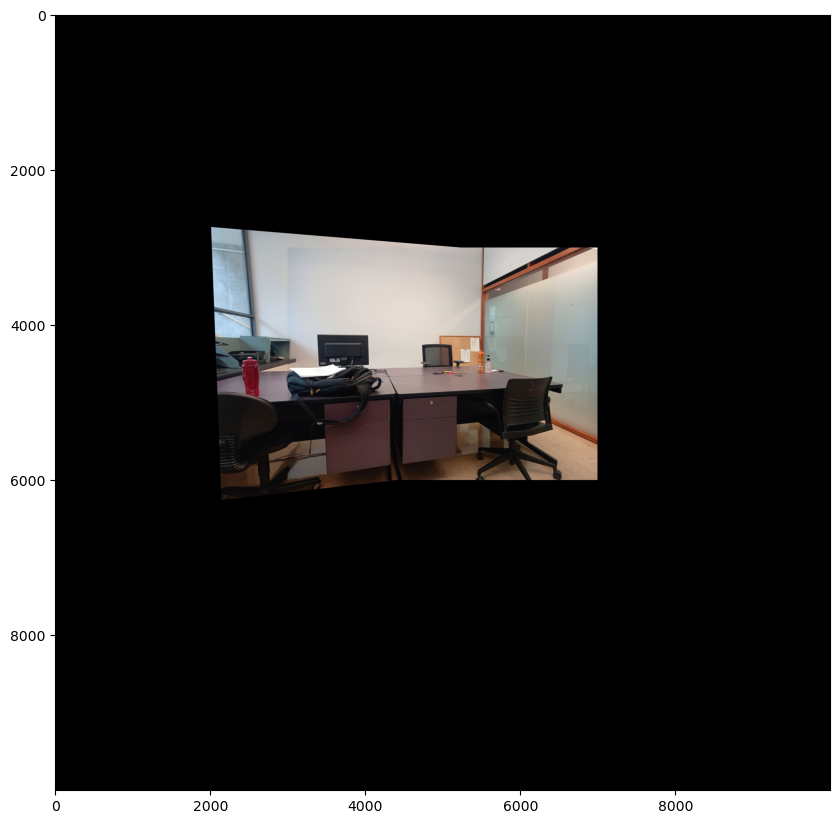

In [73]:
plt.figure(figsize=(10, 20))
plt.imshow(img1_warped)
plt.show()

In [74]:
transform = skimage.transform.ProjectiveTransform(H23)
img3_warped = skimage.transform.warp(img3_padded, transform, output_shape=(10000, 10000), order=3)

In [75]:
img3_warped[img1_warped > 0] = img1_warped[img1_warped > 0]

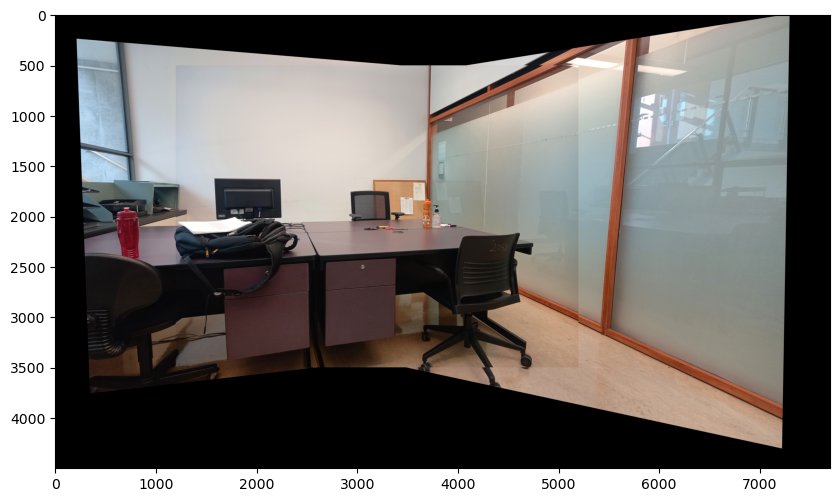

In [76]:
plt.figure(figsize=(10, 20))
plt.imshow(img3_warped[2500:7000, 1800:-500])
plt.show()